Setup And Set RunTime Type to GPU

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install
%pip install -q roboflow

import torch
import os

from IPython.display import Image, clear_output

print(f"Setup Complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else torch.cpu}")

Cloning into 'yolov5'...
remote: Enumerating objects: 15978, done.
remote: Counting objects: 100% (147/147), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 15978 (delta 89), reused 118 (delta 75), pack-reused 15831
Receiving objects: 100% (15978/15978), 14.61 MiB | 29.44 MiB/s, done.
Resolving deltas: 100% (10958/10958), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 595.6/595.6 kB 24.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.4 MB/s eta 0:00:00
Setup Complete. Using torch 2.

In [2]:
from roboflow import Roboflow

In [3]:
os.environ["DATASET DIRECTORY"] = "/content/dataset"

Get Dataset from Roboflow

In [4]:
rf = Roboflow(api_key="mvd5jAYu52kGZgKxT3vz")
project = rf.workspace("feu-mkv9v").project("email-logo-detection")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Email-Logo-Detection-2 in yolov5pytorch:: 100%|██████████| 944/944 [00:00<00:00, 1936.84it/s]


Train the Model

In [6]:
!python train.py --img-size 640 --batch 8 --epochs 300 --data {dataset.location}/data.yaml --weights yolov5m.pt --cache

train: weights=yolov5m.pt, cfg=, data=/content/yolov5/Email-Logo-Detection-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0,

Show Training Results

In [7]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

Prediction

In [8]:
!python detect.py --weight runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source {dataset.location}/valid/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/Email-Logo-Detection-2/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-178-ga199480 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 212 layers, 21059025 parameters, 0 gradients, 48.5 GFLOPs
image 1/93 /content/yolov5/Email-Logo-Detection-2/valid/images/amazon-circle-large_png.rf.61d89144be3e6dbbe3f6c8fd4aeff78a.jpg: 640x640 1 amazon, 27.5ms
image 2/93 /content/yolov5/Email-Logo-Detection-2/valid/images/amazon-square-medium_png.rf.ad88c01476a3acd8d4309af81f4765b2.jpg: 640x640 1 amazon, 27.6ms
image 3

Display Inference Images

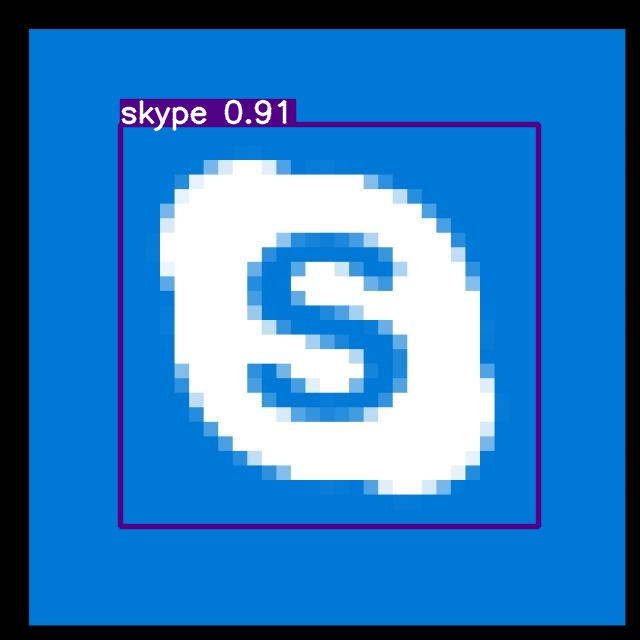

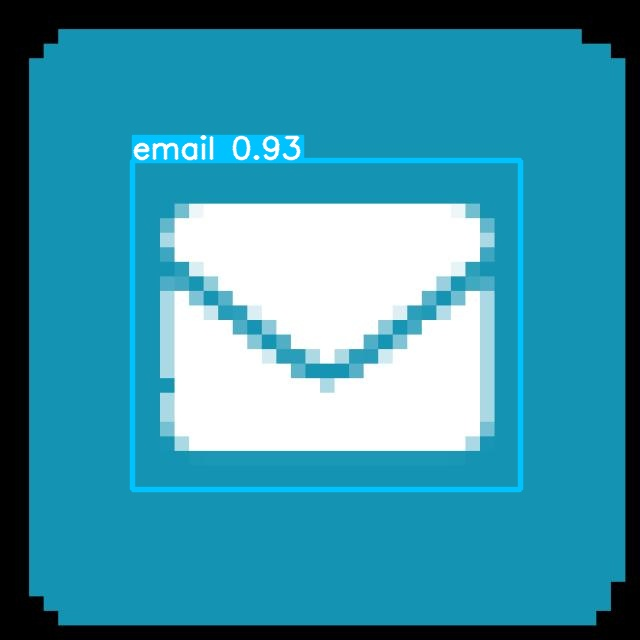

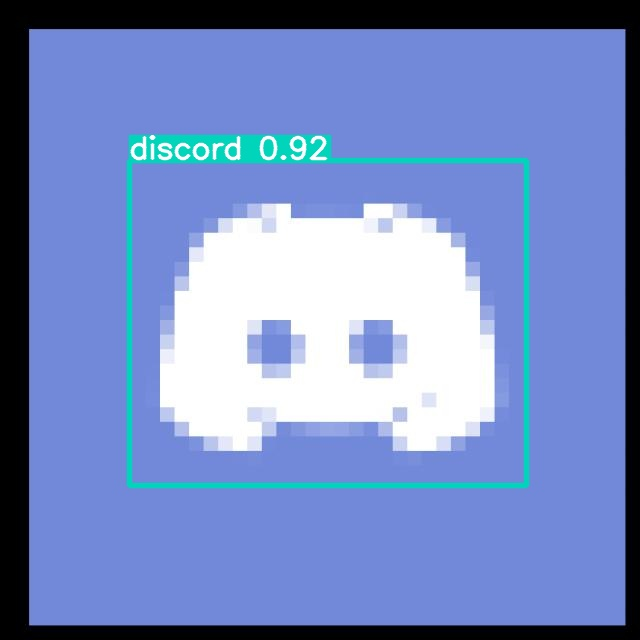

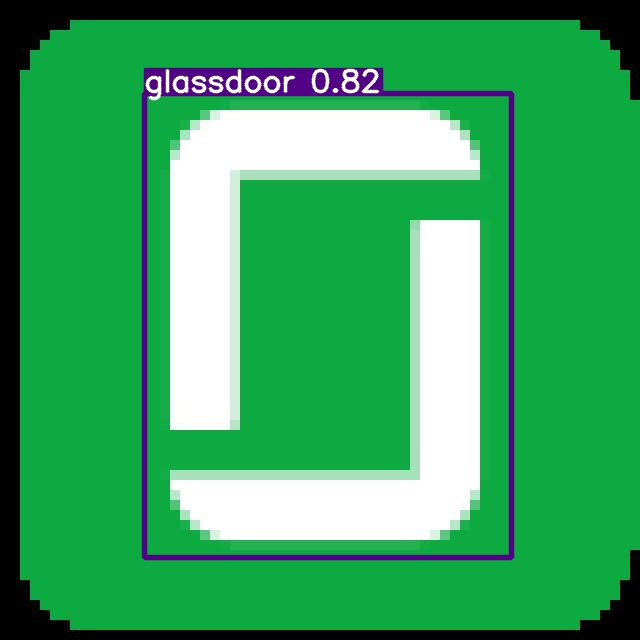

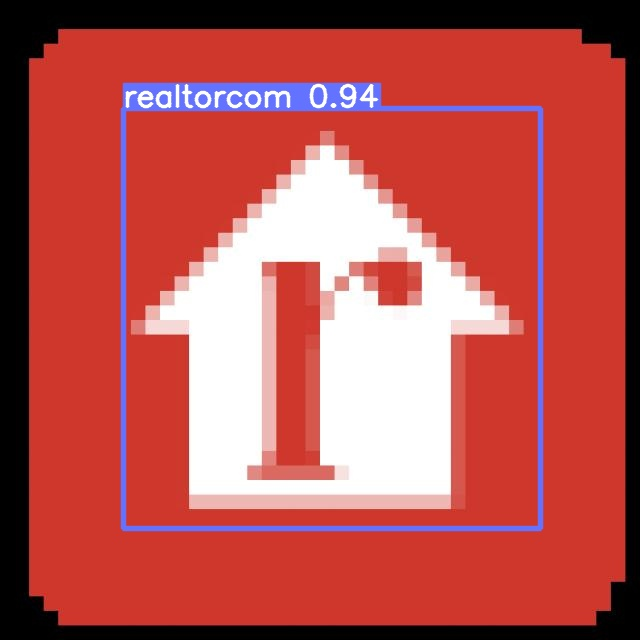

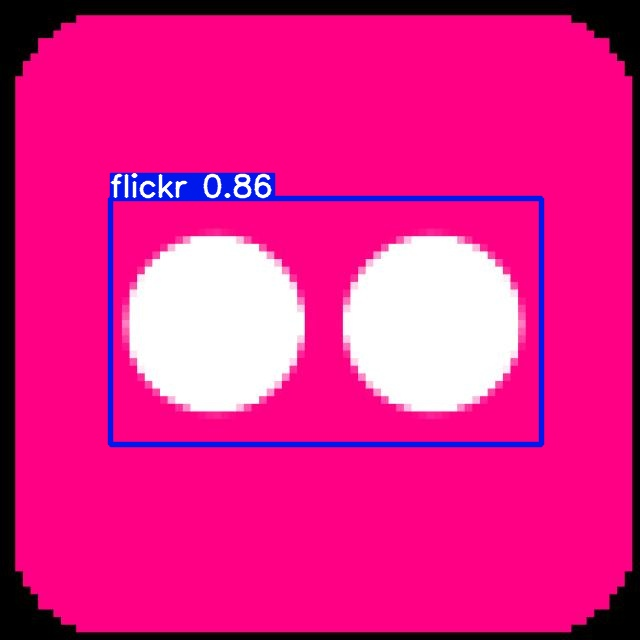

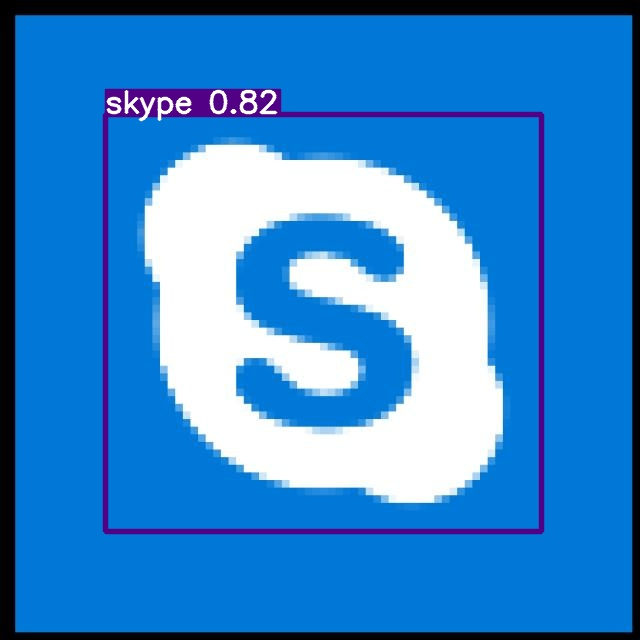

In [12]:
import glob
from IPython.display import Image, display

i=0
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
  i += 1

  if i < 8:
    display(Image(filename=imageName))
    print("\n")

Save Model

In [13]:
from google.colab import files
files.download("./runs/train/exp/weights/best.pt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>